In [4]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import seaborn as sns
import sys

sys.path.append(os.path.abspath(os.path.join('..', 'src')))

from utils import plot_pairplot, calculate_stats, correlation_with_target
from preprocessing import handle_missing_values, one_hot_encoding, normalize_df
from data_splitting import train_validate_split
from models import LogisticRegression
from metrics import plot_conf_matrix, accuracy, precision, recall, f1_score, plot_pr_curve, plot_roc_curve

RANDOM_STATE = 42
TARGET = 'Diagnosis'

TRUE_INTERVALS = {
    'CellSize': (60, 80),
    'CellShape': (0.4, 0.58),
    'NucleusDensity': (1.2, 1.6),
    'ChromatinTexture': (20, 25),
    'CytoplasmSize': (20, 34.4),
    'CellAdhesion': (0.4, 0.6),
    'MitosisRate': (2.4, 4),
    'NuclearMembrane': (2, 2.8),
    'GrowthFactor': (52, 68),
    'OxygenSaturation': (78, 84),
    'Vascularization': (4, 6),
    'InflammationMarkers': (30, 50)
}

# Load the data
cell_diagnosis_dev_df = pd.read_csv('../data/raw/cell_diagnosis_dev.csv')

cell_diagnosis_dev_df.head()

,CellSize,CellShape,NucleusDensity,ChromatinTexture,CytoplasmSize,CellAdhesion,MitosisRate,NuclearMembrane,GrowthFactor,OxygenSaturation,Vascularization,InflammationMarkers,Diagnosis,CellType,GeneticMutation
0,63.423148,0.500594,1.473261,23.300222,NaN,0.477657,3.434832,2.492852,-10.000000,78.625935,5.727217,41.158399,0.0,Epthlial,Absnt
1,72.906362,0.474808,1.361360,21.336137,29.856233,0.481035,2.702433,2.281137,63.084699,NaN,5.319552,NaN,1.0,Epthlial,Presnt
2,70.711969,0.481701,NaN,21.521406,30.582427,0.472651,2.786606,2.318029,61.347022,NaN,NaN,NaN,1.0,???,Absnt
3,73.210206,NaN,1.427612,22.437077,29.887970,0.439511,2.998380,2.149232,64.047169,80.693058,NaN,37.843069,1.0,Mesnchymal,Presnt
4,68.348288,NaN,1.454116,21.150723,28.328197,NaN,2.987601,NaN,62.197197,81.737990,4.347438,43.444881,1.0,Epthlial,Presnt


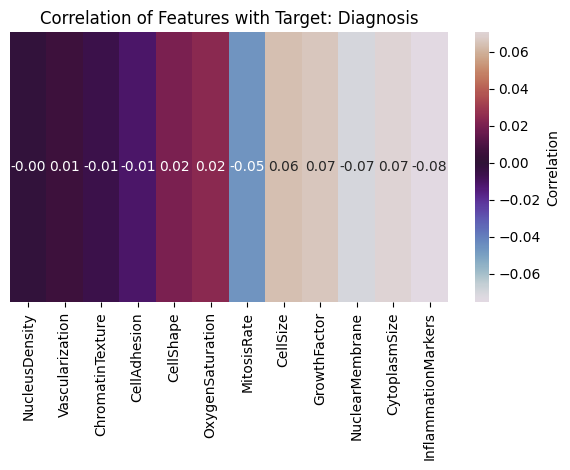

In [19]:
correlation_with_target(cell_diagnosis_dev_df, TARGET)

In [6]:
cell_diagnosis_dev_df_filled = handle_missing_values(cell_diagnosis_dev_df, true_intervals=TRUE_INTERVALS)

cell_diagnosis_dev_df_filled_OHE = one_hot_encoding(cell_diagnosis_dev_df_filled)

#save the cleaned data
cell_diagnosis_dev_df_filled_OHE.to_csv('../data/processed/cell_diagnosis_dev_cleaned.csv', index=False)

cell_diagnosis_dev_df_filled_OHE.head()


100%|██████████| 1573/1573 [00:02<00:00, 754.22it/s]


,CellSize,CellShape,NucleusDensity,ChromatinTexture,CytoplasmSize,CellAdhesion,MitosisRate,NuclearMembrane,GrowthFactor,OxygenSaturation,Vascularization,InflammationMarkers,Diagnosis,CellType_Epthlial,CellType_Mesnchymal,GeneticMutation_Presnt
0,63.423148,0.500594,1.473261,23.300222,26.849465,0.477657,3.434832,2.492852,60.148680,78.625935,5.727217,41.158399,0.0,1,0,0
1,72.906362,0.474808,1.361360,21.336137,29.856233,0.481035,2.702433,2.281137,63.084699,80.013376,5.319552,39.508947,1.0,1,0,1
2,70.711969,0.481701,1.434487,21.521406,30.582427,0.472651,2.786606,2.318029,61.347022,79.915954,5.084944,40.561055,1.0,0,0,0
3,73.210206,0.500044,1.427612,22.437077,29.887970,0.439511,2.998380,2.149232,64.047169,80.693058,5.043870,37.843069,1.0,0,1,1
4,68.348288,0.505199,1.454116,21.150723,28.328197,0.481932,2.987601,2.354617,62.197197,81.737990,4.347438,43.444881,1.0,1,0,1


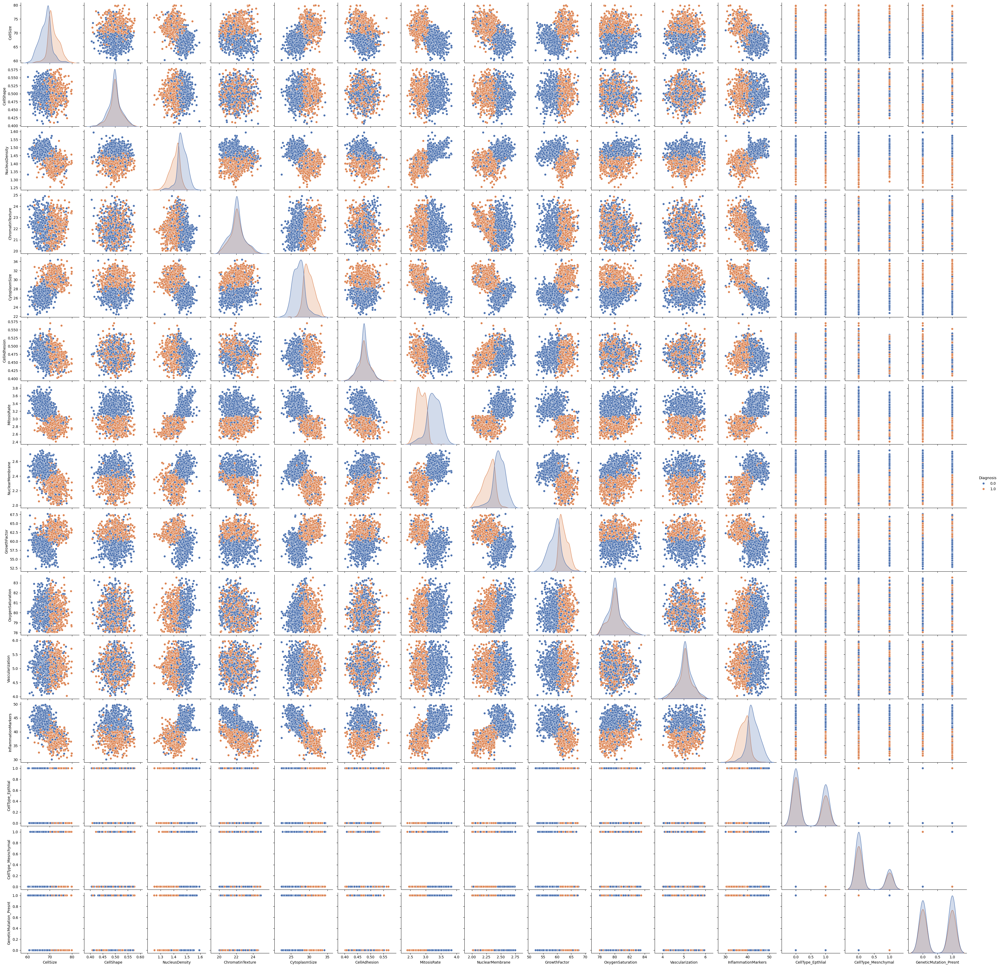

In [21]:
plot_pairplot(cell_diagnosis_dev_df_filled_OHE)

In [8]:
## split the data into train and validation sets

cell_diagnosis_train_df, cell_diagnosis_val_df = train_validate_split(cell_diagnosis_dev_df, validation_size=0.2, random_state=RANDOM_STATE)

train_stats = calculate_stats(cell_diagnosis_train_df)

cell_diagnosis_train_filled = handle_missing_values(cell_diagnosis_train_df, true_intervals=TRUE_INTERVALS)
cell_diagnosis_train_filled_OHE = one_hot_encoding(cell_diagnosis_train_filled)
cell_diagnosis_train_filled_OHE_normalized, normalized_train_stats = normalize_df(cell_diagnosis_train_filled_OHE) 
cell_diagnosis_train_filled_OHE_normalized.to_csv('../data/processed/cell_diagnosis_train_cleaned.csv', index=False)

cell_diagnosis_val_filled = handle_missing_values(cell_diagnosis_val_df, train = False, stats = train_stats, true_intervals=TRUE_INTERVALS, reference_df=cell_diagnosis_train_filled)
cell_diagnosis_val_filled_OHE = one_hot_encoding(cell_diagnosis_val_filled)
cell_diagnosis_val_filled_OHE_normalized, _ = normalize_df(cell_diagnosis_val_filled_OHE, train=False, stats=normalized_train_stats)
cell_diagnosis_val_filled_OHE_normalized.to_csv('../data/processed/cell_diagnosis_val_cleaned.csv', index=False)


100%|██████████| 319/319 [00:00<00:00, 647.82it/s]


In [9]:
cell_diagnosis_train_filled_OHE_normalized.head()

,CellSize,CellShape,NucleusDensity,ChromatinTexture,CytoplasmSize,CellAdhesion,MitosisRate,NuclearMembrane,GrowthFactor,OxygenSaturation,Vascularization,InflammationMarkers,Diagnosis,CellType_Epthlial,CellType_Mesnchymal,GeneticMutation_Presnt
0,-1.933708,0.070968,0.717071,1.406963,-0.742101,0.109719,1.268562,0.764950,-0.169004,-1.468977,2.074161,0.181940,0.0,1,0,0
1,0.998344,-0.923271,-1.575862,-0.841889,0.662768,0.259968,-1.259338,-0.731238,0.944904,-0.005698,0.854230,-0.199809,1.0,1,0,1
2,0.319874,-0.657500,-0.081794,-0.629759,1.005225,-0.112951,-0.968811,-0.470525,0.281776,-0.165806,0.127864,-0.000673,1.0,0,0,0
3,1.092287,0.026549,-0.218306,0.418673,0.677735,-1.586886,-0.237868,-1.663413,1.312199,0.627973,0.109548,-0.749418,1.0,0,1,1
4,-0.410937,0.024555,0.324773,-1.054187,-0.057819,0.070152,-0.275069,-0.093272,0.606218,1.687983,-2.054805,0.824269,1.0,1,0,1


In [10]:
cell_diagnosis_val_filled_OHE_normalized.head()

,CellSize,CellShape,NucleusDensity,ChromatinTexture,CytoplasmSize,CellAdhesion,MitosisRate,NuclearMembrane,GrowthFactor,OxygenSaturation,Vascularization,InflammationMarkers,Diagnosis,CellType_Epthlial,CellType_Mesnchymal,GeneticMutation_Presnt
1448,-0.452526,0.831515,1.108136,-1.869726,-0.031753,0.741375,0.739425,1.454386,-0.062200,1.623055,2.650680,0.831395,0.0,0,1,0
168,-0.781236,0.431795,1.576713,0.654089,0.278042,-3.247736,1.039495,1.353254,-2.113059,0.290046,0.407659,0.262243,0.0,0,1,0
220,-1.417930,1.473973,1.252830,0.909492,0.108959,-0.252084,1.594200,1.781266,-1.138561,1.591290,-1.449955,0.817707,0.0,0,1,0
1643,-0.319148,-0.320117,0.751903,0.590078,0.243552,1.182665,0.604460,1.994126,-0.395511,1.986268,-0.303086,0.738422,0.0,1,0,0
344,0.758347,0.965034,-0.762005,-0.767314,0.546700,1.590847,-0.983997,0.617972,1.196522,1.590540,1.013641,0.398700,1.0,0,1,1


Best lambda: 475.08102 with F1 Score = 0.9296
Accuracy: 0.9399
Precision: 0.8800
Recall: 0.9851
F1 Score: 0.9296


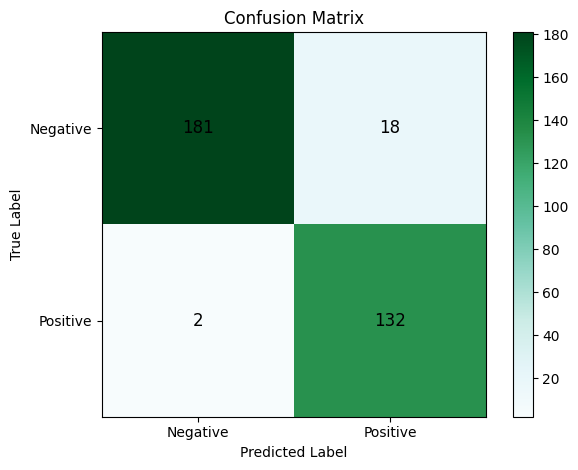

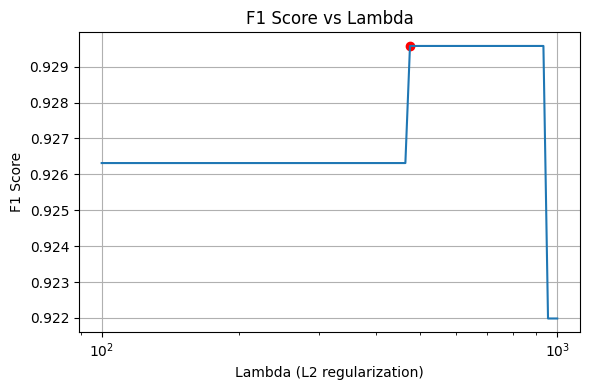

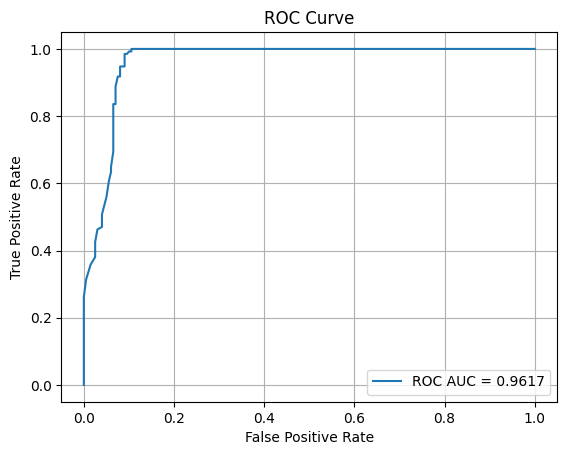

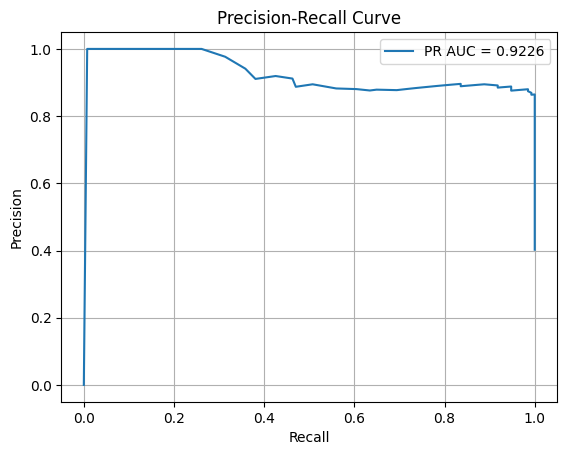

In [11]:
from metrics import plot_conf_matrix, accuracy, precision, recall, f1_score, plot_roc_curve, plot_pr_curve
import numpy as np
import matplotlib.pyplot as plt

# Preparar datos
X_train = cell_diagnosis_train_filled_OHE_normalized.drop(columns=[TARGET])
y_train = cell_diagnosis_train_filled_OHE_normalized[TARGET]

X_val = cell_diagnosis_val_filled_OHE_normalized.drop(columns=[TARGET])
y_val = cell_diagnosis_val_filled_OHE_normalized[TARGET]

# Barrido de lambdas
lambda_values = np.logspace(2, 3, 100)  # de 1e-4 a 1e2
f1_scores = []
models = []

best_f1 = -1
best_lambda = None
best_model = None

for l2 in lambda_values:
    model = LogisticRegression(l2=l2)
    model.fit(X_train, y_train)
    
    y_val_pred = model.predict(X_val)
    score = f1_score(y_val, y_val_pred)
    f1_scores.append(score)
    models.append(model)
    
    if score > best_f1:
        best_f1 = score
        best_lambda = l2
        best_model = model

print(f"Best lambda: {best_lambda:.5f} with F1 Score = {best_f1:.4f}")

# Entrenar modelo final (opcional: ya lo tenés en best_model)
final_model = best_model

# Predicción y métricas
y_pred = final_model.predict(X_val)
y_proba = final_model.predict_proba(X_val)


acc = accuracy(y_val, y_pred)
prec = precision(y_val, y_pred)
rec = recall(y_val, y_pred)
f1 = f1_score(y_val, y_pred)


print(f"Accuracy: {acc:.4f}")
print(f"Precision: {prec:.4f}")
print(f"Recall: {rec:.4f}")
print(f"F1 Score: {f1:.4f}")

plot_conf_matrix(y_val, y_pred)

# Gráfico de lambda vs F1
plt.figure(figsize=(6, 4))
plt.plot(lambda_values, f1_scores)
plt.scatter(best_lambda, best_f1, color='red', label='Best Lambda')
plt.xscale('log')
plt.xlabel("Lambda (L2 regularization)")
plt.ylabel("F1 Score")
plt.title("F1 Score vs Lambda")
plt.grid(True)
plt.tight_layout()
plt.show()

# Curvas ROC y PR
plot_roc_curve(y_val.to_numpy(), y_proba)

plot_pr_curve(y_val.to_numpy(), y_proba)



100%|██████████| 174/174 [00:00<00:00, 756.23it/s]


Test Accuracy: 0.9622
Test Precision: 0.9419
Test Recall: 0.9759
Test F1 Score: 0.9586


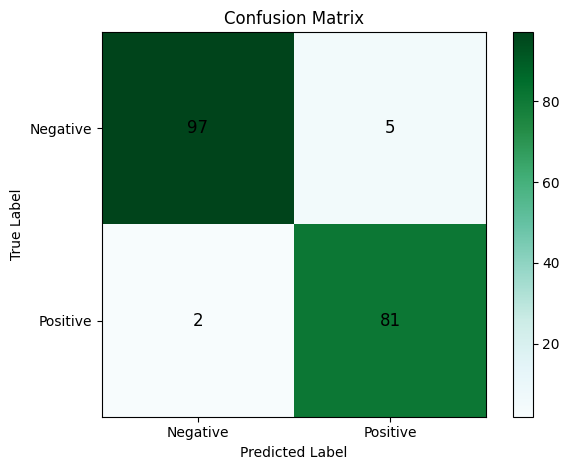

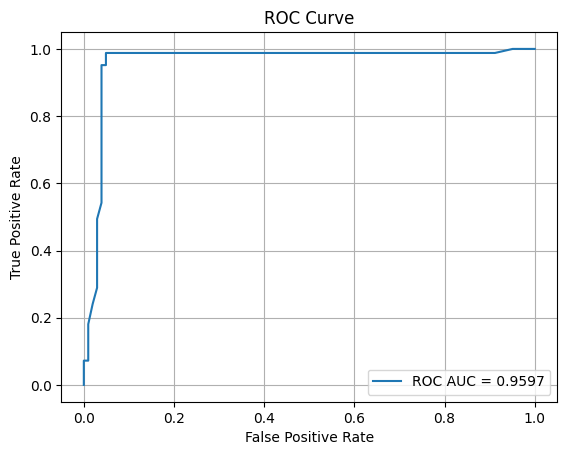

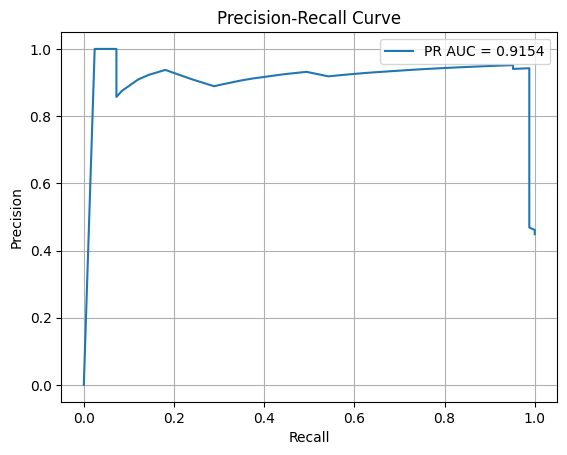

In [12]:
# test the model with the test set
cell_diagnosis_test_df = pd.read_csv('../data/raw/cell_diagnosis_test.csv')

cell_diagnosis_test_df_filled = handle_missing_values(cell_diagnosis_test_df, true_intervals=TRUE_INTERVALS, train=False, stats=train_stats, reference_df=cell_diagnosis_train_filled)
cell_diagnosis_test_df_filled_OHE = one_hot_encoding(cell_diagnosis_test_df_filled)
cell_diagnosis_test_df_filled_OHE_normalized, _ = normalize_df(cell_diagnosis_test_df_filled_OHE, train=False, stats=normalized_train_stats)
cell_diagnosis_test_df_filled_OHE_normalized.to_csv('../data/processed/cell_diagnosis_test_cleaned.csv', index=False)

cell_diagnosis_test_df_filled_OHE_normalized.head()

# Preparar datos
X_test = cell_diagnosis_test_df_filled_OHE_normalized.drop(columns=[TARGET])
y_test = cell_diagnosis_test_df_filled_OHE_normalized[TARGET]

# Predicción y métricas
y_pred_test = final_model.predict(X_test)
y_proba_test = final_model.predict_proba(X_test)

acc_test = accuracy(y_test, y_pred_test)
prec_test = precision(y_test, y_pred_test)
rec_test = recall(y_test, y_pred_test)
f1_test = f1_score(y_test, y_pred_test)

print(f"Test Accuracy: {acc_test:.4f}")
print(f"Test Precision: {prec_test:.4f}")
print(f"Test Recall: {rec_test:.4f}")
print(f"Test F1 Score: {f1_test:.4f}")

plot_conf_matrix(y_test, y_pred_test)
plot_roc_curve(y_test.to_numpy(), y_proba_test)
plot_pr_curve(y_test.to_numpy(), y_proba_test)